In [1]:
# REDACTED CODE (IMPORTS)

In [2]:
# REDACTED CODE (FINDING POINTS, FINDING FOE, CLUSTERING CODE)

In [3]:
# REDACTED CODE (DRAWING LINE AND POINT CODE)

In [4]:
# REDACTED CODE (DRIVER FUNCTION FOR FULL PROCESS)

In [5]:
# REDACTED CODE (GETTING IMAGES)

In [6]:
# REDACTED CODE

IMAGES 000003_10.png and 000003_11.png
RANSAC RATIO: 0.8872512896094326
FOE FOUND: True
NUMBER OF CLUSTERS: 13


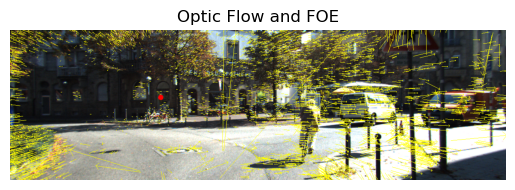

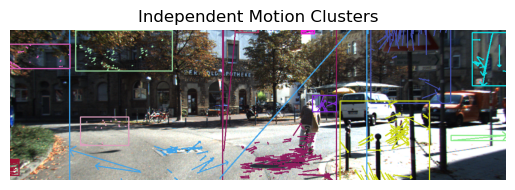

IMAGES 000005_10.png and 000005_11.png
RANSAC RATIO: 0.9419573942574869
FOE FOUND: True
NUMBER OF CLUSTERS: 11


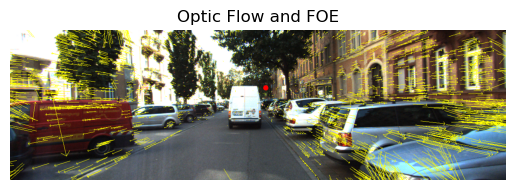

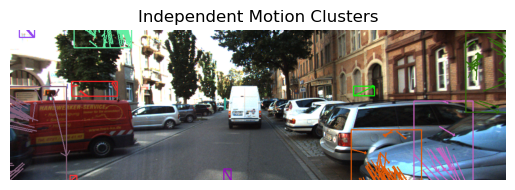

IMAGES 000017_10.png and 000017_11.png
RANSAC RATIO: 0.4274061990212072
FOE FOUND: False
NUMBER OF CLUSTERS: 4


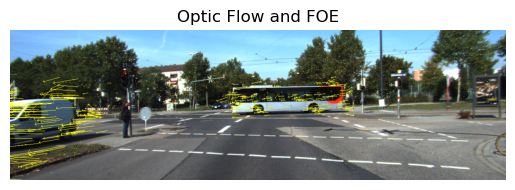

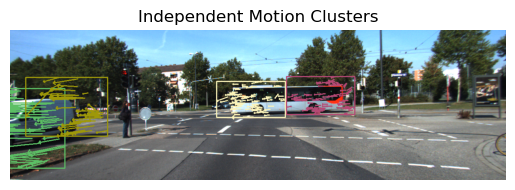

IMAGES 000020_10.png and 000020_11.png
RANSAC RATIO: 0.8351254480286738
FOE FOUND: True
NUMBER OF CLUSTERS: 13


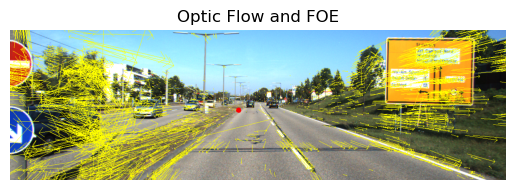

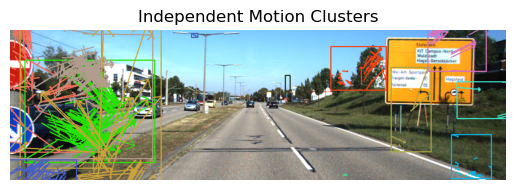

IMAGES 000035_10.png and 000035_11.png
RANSAC RATIO: 0.9433867735470942
FOE FOUND: True
NUMBER OF CLUSTERS: 9


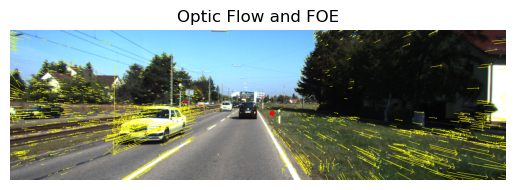

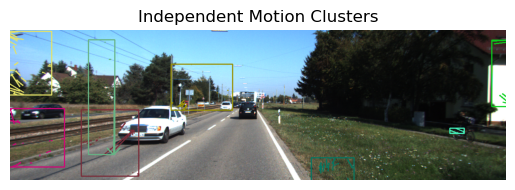

IMAGES 000066_10.png and 000066_11.png
RANSAC RATIO: 0.8597612958226769
FOE FOUND: True
NUMBER OF CLUSTERS: 9


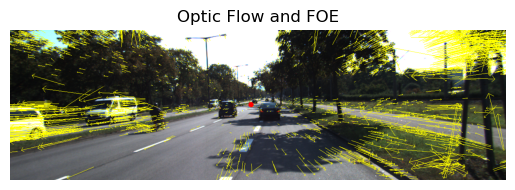

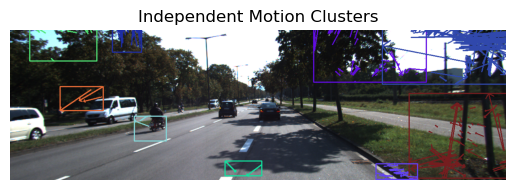

IMAGES 000067_10.png and 000067_11.png
RANSAC RATIO: 0.9145797598627787
FOE FOUND: True
NUMBER OF CLUSTERS: 10


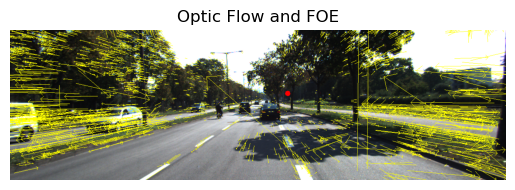

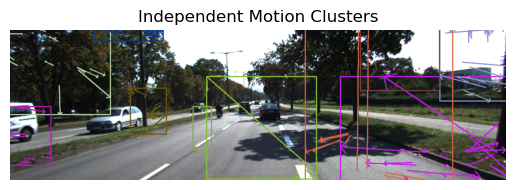

IMAGES 000101_10.png and 000101_11.png
RANSAC RATIO: 0.8702810105024127
FOE FOUND: True
NUMBER OF CLUSTERS: 10


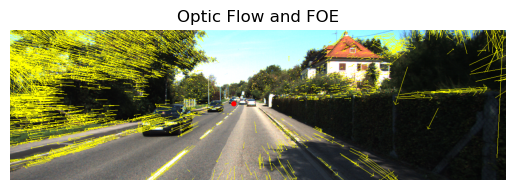

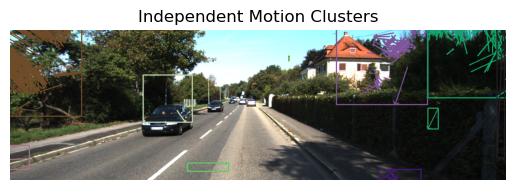

IMAGES 000102_10.png and 000102_11.png
RANSAC RATIO: 0.7827037152669373
FOE FOUND: True
NUMBER OF CLUSTERS: 12


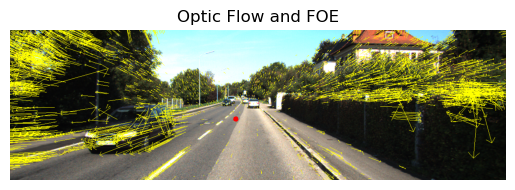

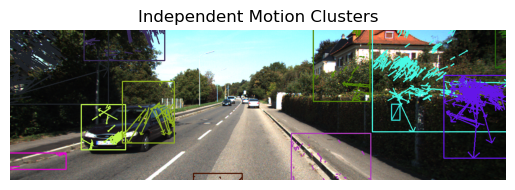

IMAGES 000105_10.png and 000105_11.png
RANSAC RATIO: 0.9025695931477516
FOE FOUND: True
NUMBER OF CLUSTERS: 10


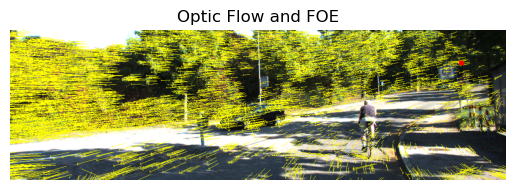

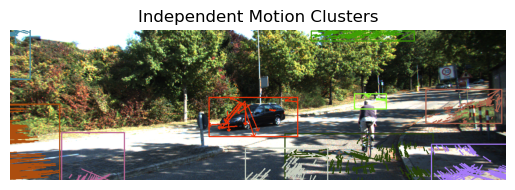

IMAGES 000109_10.png and 000109_11.png
RANSAC RATIO: 0.895662368112544
FOE FOUND: True
NUMBER OF CLUSTERS: 14


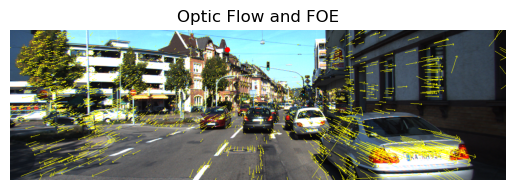

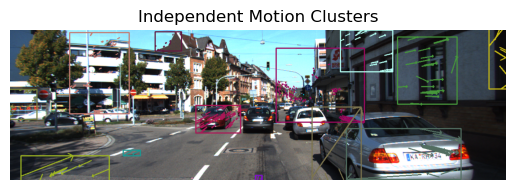

IMAGES 000110_10.png and 000110_11.png
RANSAC RATIO: 0.7646903820816864
FOE FOUND: True
NUMBER OF CLUSTERS: 17


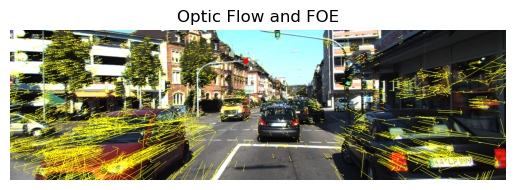

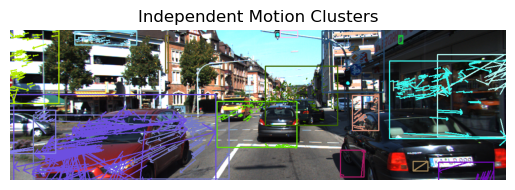

IMAGES 000123_10.png and 000123_11.png
RANSAC RATIO: 0.9484044139576498
FOE FOUND: True
NUMBER OF CLUSTERS: 12


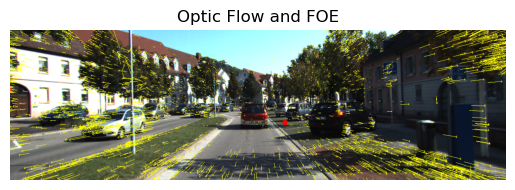

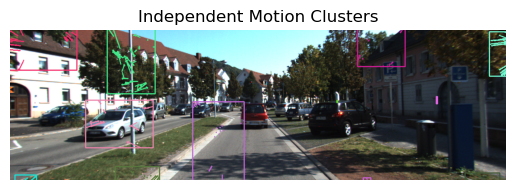

IMAGES 000130_10.png and 000130_11.png
RANSAC RATIO: 0.3776618861364624
FOE FOUND: False
NUMBER OF CLUSTERS: 2


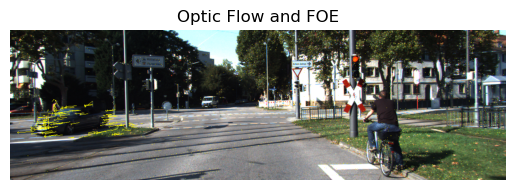

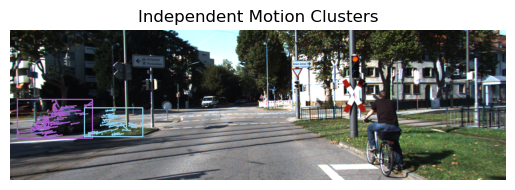

IMAGES 000131_10.png and 000131_11.png
RANSAC RATIO: 0.4418655097613883
FOE FOUND: False
NUMBER OF CLUSTERS: 3


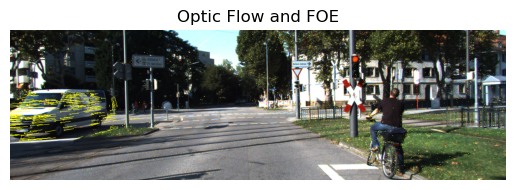

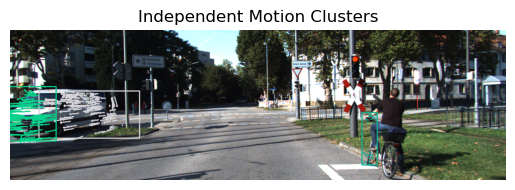

IMAGES 000149_10.png and 000149_11.png
RANSAC RATIO: 0.7736085053158224
FOE FOUND: True
NUMBER OF CLUSTERS: 10


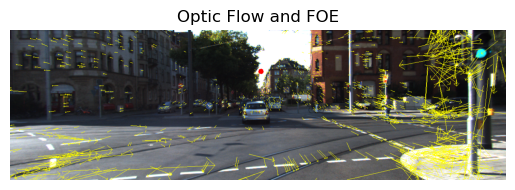

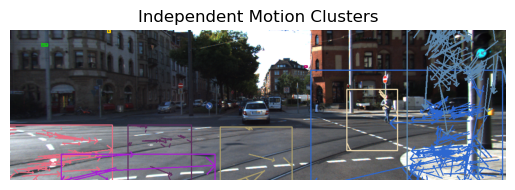

IMAGES 000150_10.png and 000150_11.png
RANSAC RATIO: 0.8475467289719626
FOE FOUND: True
NUMBER OF CLUSTERS: 14


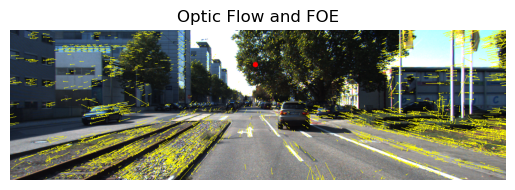

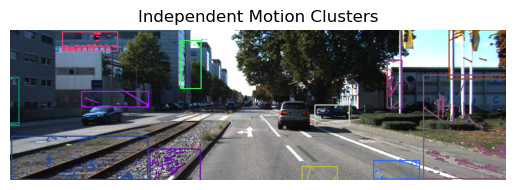

IMAGES 000151_10.png and 000151_11.png
RANSAC RATIO: 0.8877521192633733
FOE FOUND: True
NUMBER OF CLUSTERS: 12


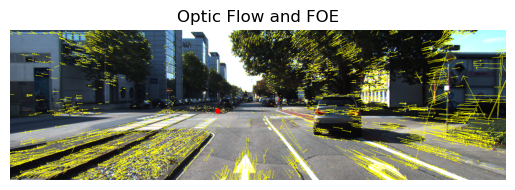

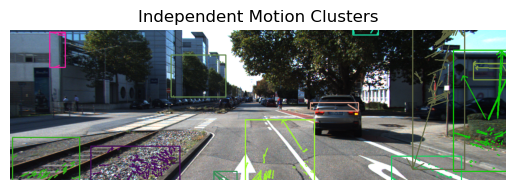

IMAGES 000169_10.png and 000169_10_0.png
RANSAC RATIO: 0.678530859522908
FOE FOUND: False
NUMBER OF CLUSTERS: 7


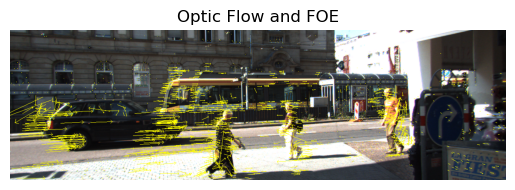

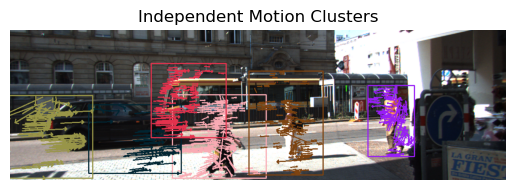

IMAGES 000169_10_1.png and 000169_10_2.png
RANSAC RATIO: 0.9481878509443593
FOE FOUND: True
NUMBER OF CLUSTERS: 7


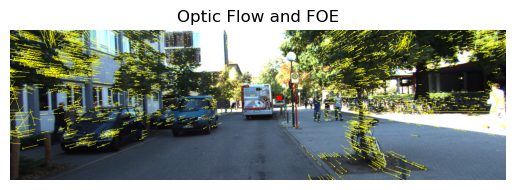

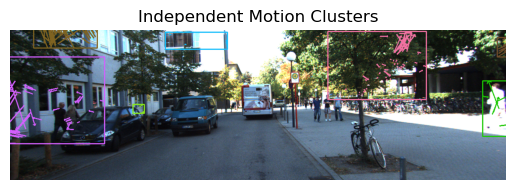

IMAGES 000170_10.png and 000170_11.png
RANSAC RATIO: 0.9526315789473684
FOE FOUND: True
NUMBER OF CLUSTERS: 9


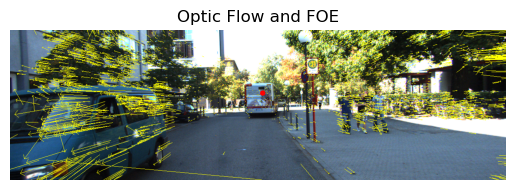

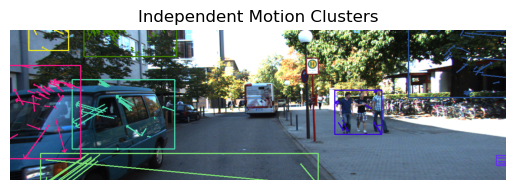

IMAGES 000182_10.png and 000182_11.png
RANSAC RATIO: 0.8396726047183438
FOE FOUND: True
NUMBER OF CLUSTERS: 13


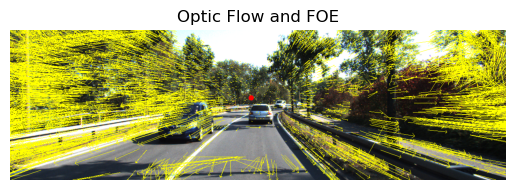

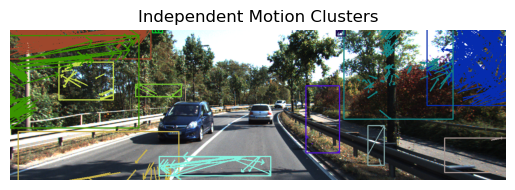

IMAGES 000186_10.png and 000186_11.png
RANSAC RATIO: 0.8393194706994329
FOE FOUND: True
NUMBER OF CLUSTERS: 14


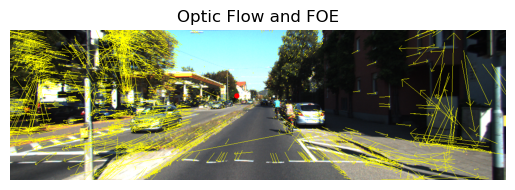

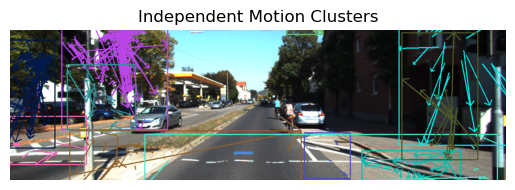

IMAGES 000198_10.png and 000198_11.png
RANSAC RATIO: 0.9874572405929305
FOE FOUND: True
NUMBER OF CLUSTERS: 4


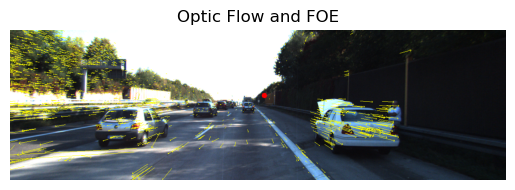

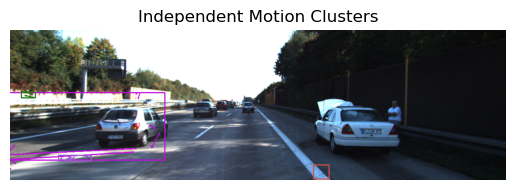

IMAGES 000199_10.png and 000199_11.png
RANSAC RATIO: 0.9831804281345565
FOE FOUND: True
NUMBER OF CLUSTERS: 5


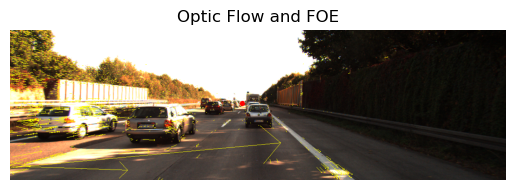

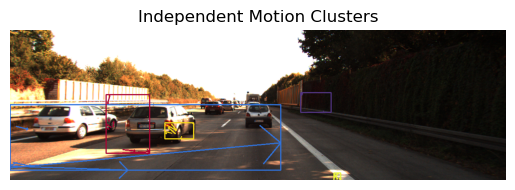

In [7]:
# REDACTED CODE (PRINTING OUTPUTS)

## Evalulation:
My algorithm is split into three main functions: motion estimation, foe detection, and clustering. These functions are then controlled by a driver function run_process, which is also responsible for output. 

For estimating motion, I used SIFT keypoints which I felt were a good candidate for tracking, compared to something like Harris keypoints. I am aware that OpenCV also has a function for generating points deliberately for tracking but I did not look into it. I then used a Lucas Kanade Pyramid method for Optical Flow calculation.

For FOE detection, I used RANSAC given the lines extended from each SIFT keypoint. Due to the large amount of noise with LK optic flow, I chose a high RANSAC tau of 100 pixels and ran 200 iterations (this worked quickly and did not compromise much time). The rest of the implementation of RANSAC is straight forward and I calculated a mask to determine the number of inliers and outliers, the outliers being the independent points and vectors. I determined if a FOE was present by comparing the ratio of inliers to total lines to a threshold ratio of 0.7. This number was also experimentally determined by looking at the above images and their corresponding ratios. 

Please note the following optimization: If a FOE was determined, I would consider all outliers to be the independent vectors. If no FOE was determined, I would filter out the optic flow vectors by magnitude, specifically by taking the average norm and masking out those with a norm greater than this. This was to remove most of the tiny vectors left over from optic flow calculation and worked great. 

For clustering, I took in the independent vectors generated features of length 4 containing the starting point followed by the vector. I then defined a custom difference function as described in the notes and chose a scale factor of 0.7 for the distance between starting points. I used average distance for clusters and a distance threshold of 100 pixels.

## Decisions, Tradeoffs, and Results:
A lot of my decisions and their tradeoffs were explained above, this section is intended to elaborate more into some choices.

SIFT keypoints are a good tracking solution, but did not choose points specifically for tracking like cv2's good points for tracking method.

RANSAC threshold of 100 pixels sees a more precise convergence of FOE (more lines accounted) and better deals with error with PyrLK. However, this will segment out a lot of possible independent objects (outliers). THIS IS THE LARGEST TRADEOFF I NOTICED!!! A result of this means that most vectors near or pointing towards FOE will be LOST and deemed DEPENDENT. This is a huge problem with driving datasets as it means that, for example, oncoming cars are NOT DETECTED EASILY! (their vectors are TOO SIMILAR to the camera's motion)

IMAGES 000101_10.png and 000101_11.png
RANSAC RATIO: 0.8697133125177405
FOE FOUND: True
NUMBER OF CLUSTERS: 10


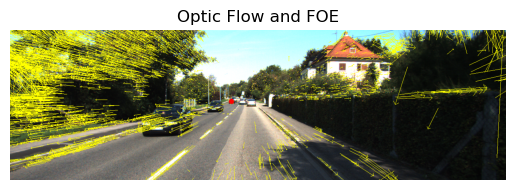

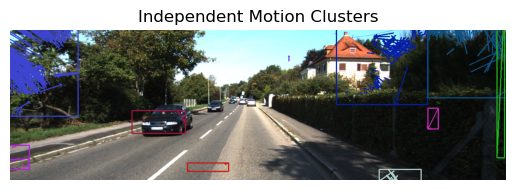

In this example, the oncoming car is not picked up!


In [8]:
print("IMAGES {} and {}".format(img_name[14],img_name[15]))
run_process(imgs[14],imgs[15])
print("In this example, the oncoming car is not picked up!")

FOE is chosen if RANSAC threshold hits 70% of total lines. While a lower number would pick up more camera motion, this threshold picked up enough of what I anticipated. This has similar tradeoffs to the previous RANSAC threshold as the two go hand-in-hand. Problems can come up when some images have a lot of noisy independent components which can lower the ratio of optic flow caused by the camera motion. Note in any of our examples, this did not come up.

IMAGES 000169_10.png and 000169_10_0.png
RANSAC RATIO: 0.6773949261643317
FOE FOUND: False
NUMBER OF CLUSTERS: 7


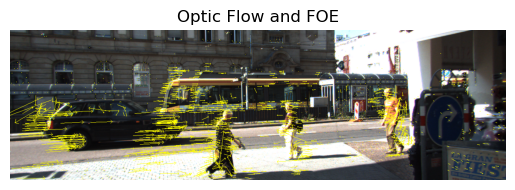

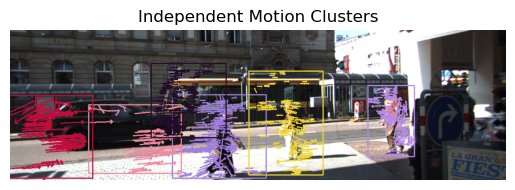

This example was partly why I chose 70%, as this image has no camera motion but a lot of lateral motion. With the RANSAC threshold of 100 pixels a lot of these vectors are picked up, so the ratio needs to be high as well.


In [9]:
print("IMAGES {} and {}".format(img_name[36],img_name[37]))
run_process(imgs[36],imgs[37])
print("This example was partly why I chose 70%, as this image has no camera motion but a lot of lateral motion. With the RANSAC threshold of 100 pixels a lot of these vectors are picked up, so the ratio needs to be high as well.")

If a FOE is found, the independent points are the outliers. The issue with this and RANSAC is that independently moving objects similar to the camera's motion aren't picked up. This is the tradeoff for a higher RANSAC threshold (100 pixels) as one misses more independent motion vectors.

If no FOE is found, the independent points are all optic flow vectors with a magnitude greater than the average magnitude. This is to get rid of small noisy optic flow vectors that aren't actual moving objects. This proved highly effective. The tradeoff is that using an average means that large optic flow vectors or the presence of strong motion can drown out smaller independently moving objects, say a tree moving in the wind.

IMAGES 000017_10.png and 000017_11.png
RANSAC RATIO: 0.42805872756933117
FOE FOUND: False
NUMBER OF CLUSTERS: 4


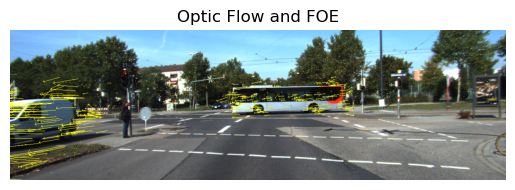

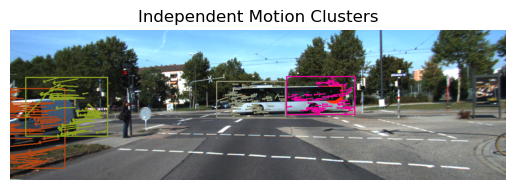

Note how there are a lot of yellow dots in the trees: noise. These are removed and the output is logical.


In [10]:
print("IMAGES {} and {}".format(img_name[4],img_name[5]))
run_process(imgs[4],imgs[5])
print("Note how there are a lot of yellow dots in the trees: noise. These are removed and the output is logical.")

I also used averaging for my agglomerative clustering which can cause large independent moving objects to be split up. I chose averaging however because, with so many optic flow vectors, single would lead to bad artifacts and combining of clearly different groups. A tradeoff can be seen above: the van and bus are split into two separate clusters. However, if single was used, the pedestrian example shown before may all be grouped together.

A major problem I found with my code was that I don't do anything about large outlier vectors. A solution may be to apply some statistical outlier removal algorithms (or maybe even RANSAC to select optic flow vectors themselves). This becomes problematic because these outlier vectors will be deemed independent and generate large bounding boxes in my output.

IMAGES 000003_10.png and 000003_11.png
RANSAC RATIO: 0.8872512896094326
FOE FOUND: True
NUMBER OF CLUSTERS: 14


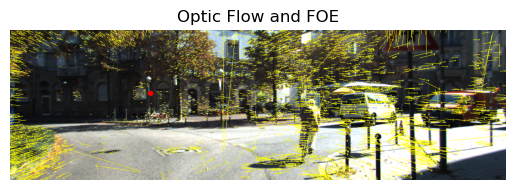

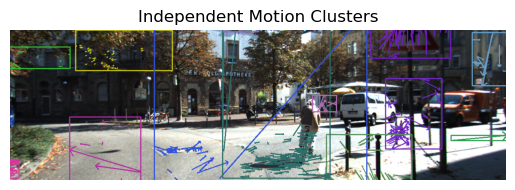

In [11]:
print("IMAGES {} and {}".format(img_name[0],img_name[1]))
run_process(imgs[0],imgs[1])

The following is a brief selection of times where my algorithm worked well, or had notable shortcomings:

IMAGES 000105_10.png and 000105_11.png
RANSAC RATIO: 0.9031814010400734
FOE FOUND: True
NUMBER OF CLUSTERS: 13


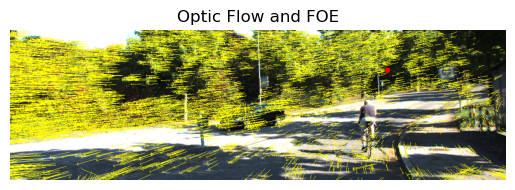

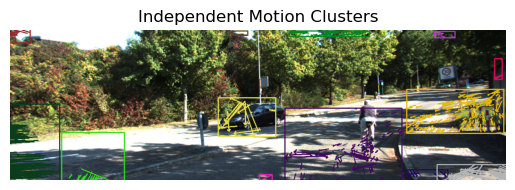

IMAGES 000131_10.png and 000131_11.png
RANSAC RATIO: 0.43080260303687634
FOE FOUND: False
NUMBER OF CLUSTERS: 3


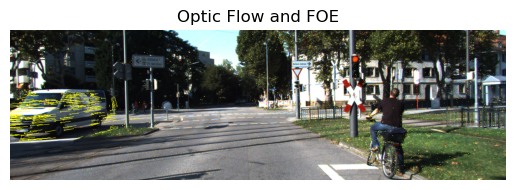

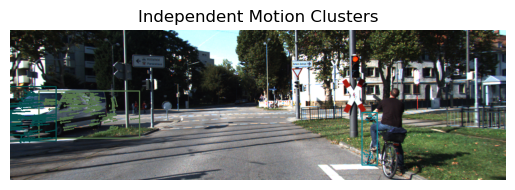

IMAGES 000110_10.png and 000110_11.png
RANSAC RATIO: 0.7889328063241107
FOE FOUND: True
NUMBER OF CLUSTERS: 15


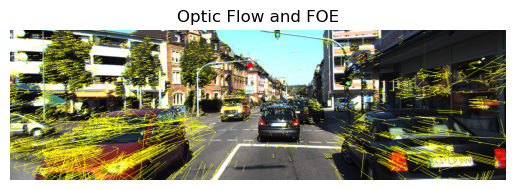

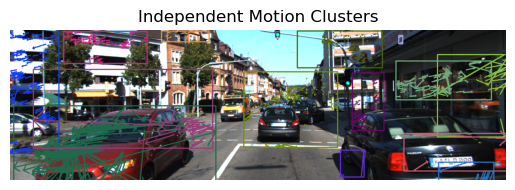

In [12]:
print("IMAGES {} and {}".format(img_name[18],img_name[19]))
run_process(imgs[18],imgs[19])
print("IMAGES {} and {}".format(img_name[28],img_name[29]))
run_process(imgs[28],imgs[29])
print("IMAGES {} and {}".format(img_name[22],img_name[23]))
run_process(imgs[22],imgs[23])